In [1]:
import folium
import geopandas as gpd
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
import scipy.stats as stats
from ETL.common import execute_query
from fitter import Fitter
from sdv.metadata import Metadata
from sdv.single_table import CTGANSynthesizer
from sdv.evaluation.single_table import run_diagnostic, evaluate_quality

C:\Users\jcf\AppData\Roaming\Python\Python311\site-packages\matplotlib\projections\__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


In [2]:
# filtered histograms
# correlations
# latlon
# Price heatmap
# surface heatmap
# energy and emissions heatmap

In [3]:
q = "SELECT * FROM houses_clean ORDER BY timestamp DESC"
df_raw = execute_query(q)

In [4]:
# df_raw.sort_values(by="surface")

In [5]:
cat_cols = ["active", "city", "type", "orientation", "age", "parking", "floor", 
            "elevator", "furniture", "state", "heating", "water_heating", 
            "formatted_address", "pets"]
num_cols = ["price", "rooms", "bathrooms", "surface", "latitude", "longitude"]

plot_cols = cat_cols + num_cols

df = df_raw.copy()

df.loc[df["surface"] <= 1, "surface"] = None

for c in cat_cols:
    df[c] = df[c].fillna("Null")
    if c == "age":
        df[c] = pd.Categorical(df[c], ["Null", "Menos de 1 año", "1 a 5 años", "5 a 10 años", "10 a 20 años", 
                                       "20 a 30 años", "30 a 50 años", "70 a 100 años", "+ 100 años"])
    elif c == "floor":
        df[c] = pd.Categorical(df[c], ["Null", "Sótano", "Otro", "Bajos", "Entresuelo", "1ª planta", "2ª planta",
                                       "3ª planta", "4ª planta", "5ª planta", "6ª planta", "7ª planta", 
                                       "8ª planta", "9ª planta", "10ª planta",  "11ª planta", "12ª planta",
                                       "13ª planta", "14ª planta", "A partir de la 15ª planta"])
    elif c == "orientation":
        df[c] = pd.Categorical(df[c], ["Null", "Este", "Noreste", "Norte", "Noroeste", "Oeste", "Suroeste", "Sur", "Sureste"])
    else:
        df[c] = pd.Categorical(df[c])

group_cols = [e for e in cat_cols if e not in ("active", "formatted_address")]

In [6]:
for c in plot_cols:    
    if c not in ("formatted_address"):
        fig = px.histogram(df[c].sort_values())
        fig.show()

In [8]:
original_data = df.copy()[group_cols+num_cols]

for c in cat_cols:
    if c in original_data.columns:
        original_data[c] = original_data[c].astype(object)

try:
    metadata = Metadata.load_from_json("metadata_ctgan.json")
except FileNotFoundError:
    metadata = Metadata.detect_from_dataframe(
        data=original_data,
        table_name='houses')
    metadata.save_to_json("metadata_ctgan.json")

try:
    CTGANSynthesizer.load("CTGANSynthesizer.pkl")
except FileNotFoundError:
    synthesizer = CTGANSynthesizer(metadata, locales=["es_ES"])
    synthesizer.fit(original_data)
    synthesizer.save("CTGANSynthesizer.pkl")

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\rdt\transformers\pii\anonymizer.py:102: UserWarning:

Locales ['es_ES'] do not support provider 'geo' and function 'longitude'.
In place of these locales, 'en_US' will be used instead. Please refer to the localized provider docs for more information: https://faker.readthedocs.io/en/master/locales.html

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\rdt\transformers\pii\anonymizer.py:102: UserWarning:

Locales ['es_ES'] do not support provider 'geo' and function 'latitude'.
In place of these locales, 'en_US' will be used instead. Please refer to the localized provider docs for more information: https://faker.readthedocs.io/en/master/locales.html

  File "C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


In [9]:
synthetic_data = synthesizer.sample(num_rows=original_data.shape[0])
synthetic_data["pets"] = synthetic_data["pets"].astype(str).str.lower()
synthetic_data["pets"] = synthetic_data["pets"].str.replace("null", "Null")

In [10]:
diagnostic = run_diagnostic(df[group_cols+num_cols], synthetic_data, metadata)
quality_report = evaluate_quality(df[group_cols+num_cols], synthetic_data, metadata)

Generating report ...

(1/2) Evaluating Data Validity: |████████████████████████████████████████████████████| 18/18 [00:00<00:00, 217.67it/s]|
Data Validity Score: 99.2%

(2/2) Evaluating Data Structure: |██████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23.43it/s]|
Data Structure Score: 20.0%

Overall Score (Average): 59.6%

Generating report ...

(1/2) Evaluating Column Shapes: |████████████████████████████████████████████████████| 18/18 [00:00<00:00, 141.01it/s]|
Column Shapes Score: 90.58%

(2/2) Evaluating Column Pair Trends: |█████████████████▋                            | 59/153 [00:00<00:00, 160.08it/s]|

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.



(2/2) Evaluating Column Pair Trends: |███████████████████████████▉                  | 93/153 [00:00<00:00, 154.12it/s]|

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.



(2/2) Evaluating Column Pair Trends: |█████████████████████████████████████████████| 153/153 [00:00<00:00, 172.22it/s]|
Column Pair Trends Score: 79.1%



C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\P

Overall Score (Average): 84.84%



In [11]:
synthetic_data.head(5)

,city,type,orientation,age,parking,floor,elevator,furniture,state,heating,water_heating,pets,price,rooms,bathrooms,surface,latitude,longitude
0,Soria,Ático,Null,30 a 50 años,Privado,Null,true,Null,Ourense,Gasóleo,Gas Natural,Null,3159.0,3.0,3.0,184.0,-4.719854,-158.843956
1,Barcelona,Piso,Null,70 a 100 años,Privado,Null,Null,true,La Rioja,Null,Null,Null,1243.0,3.0,1.0,NaN,10.056160,-155.045984
2,Cáceres,Piso,Null,NaN,Null,1ª planta,true,true,Burgos,Electricidad,Electricidad,Null,1053.0,3.0,1.0,58.0,50.049988,142.826941
3,Huesca,Estudio,Null,Null,Null,Null,Null,Null,Burgos,Null,Null,Null,1325.0,2.0,2.0,64.0,22.657710,29.785586
4,Murcia,Loft,Suroeste,+ 100 años,Privado,Entresuelo,true,true,Valencia,Butano,Electricidad,true,2660.0,3.0,2.0,130.0,-32.598098,41.902607


type


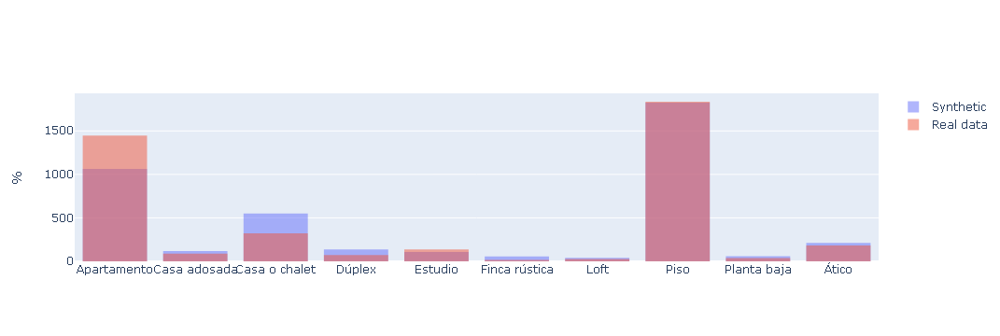

orientation


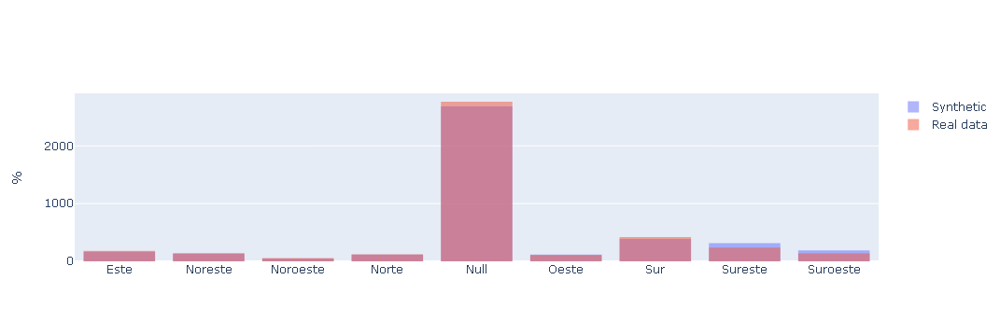

age


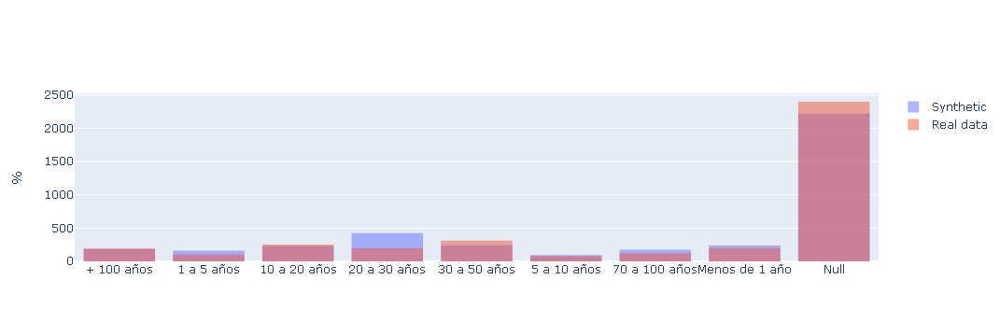

parking


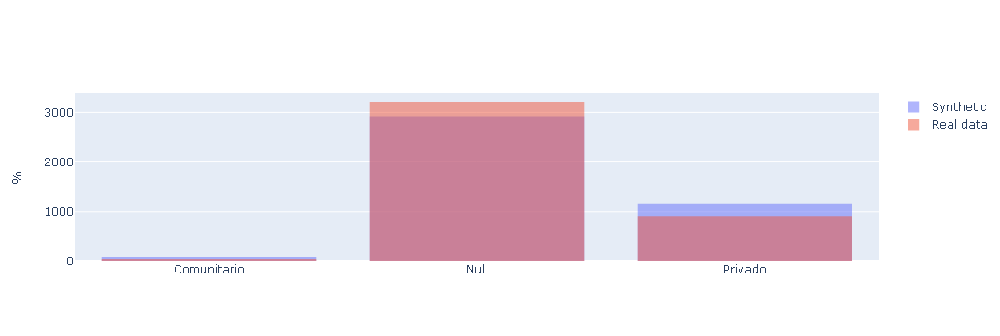

floor


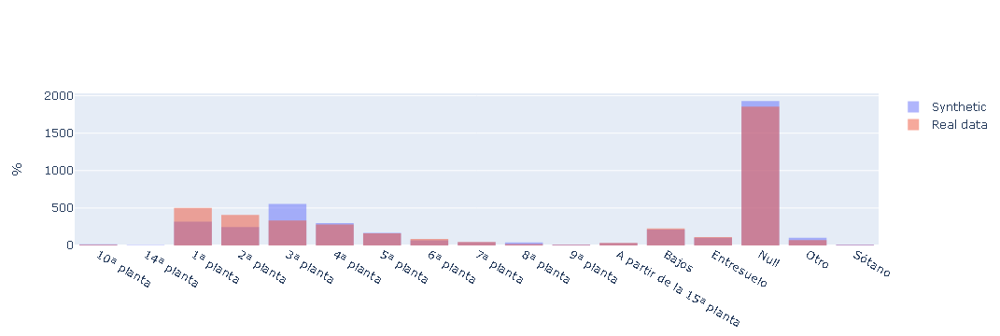

elevator


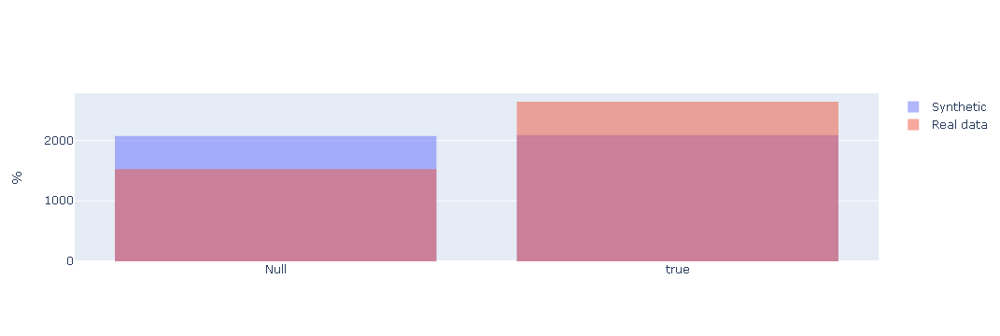

furniture


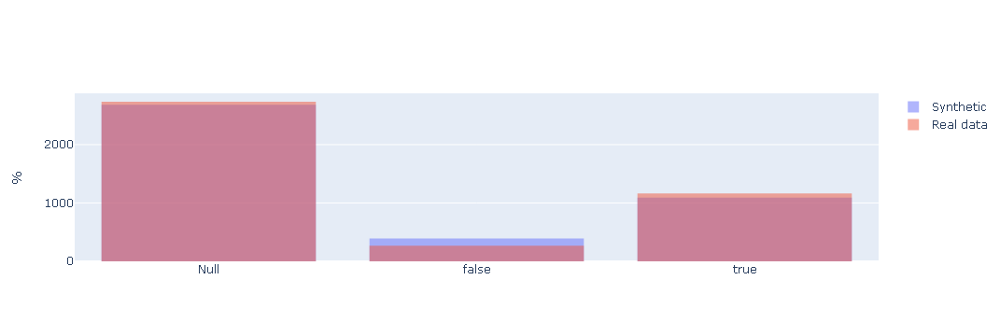

state


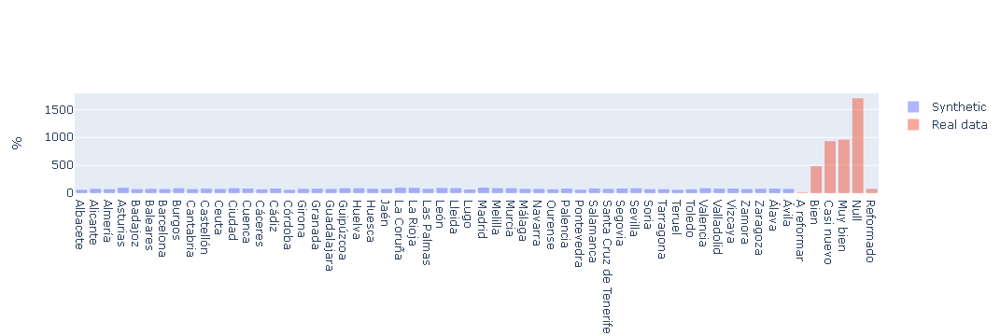

heating


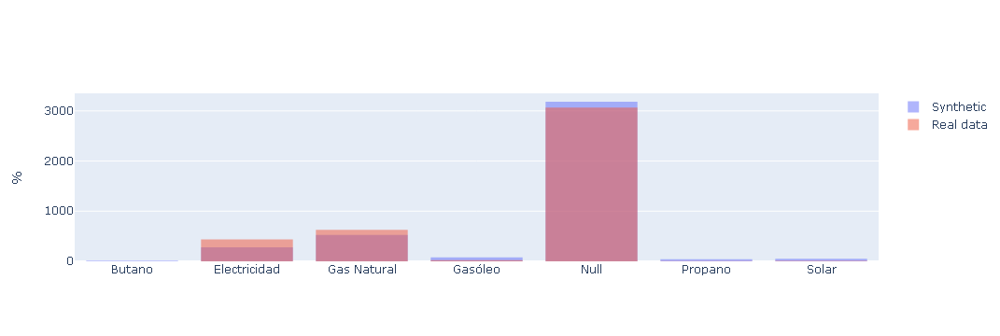

water_heating


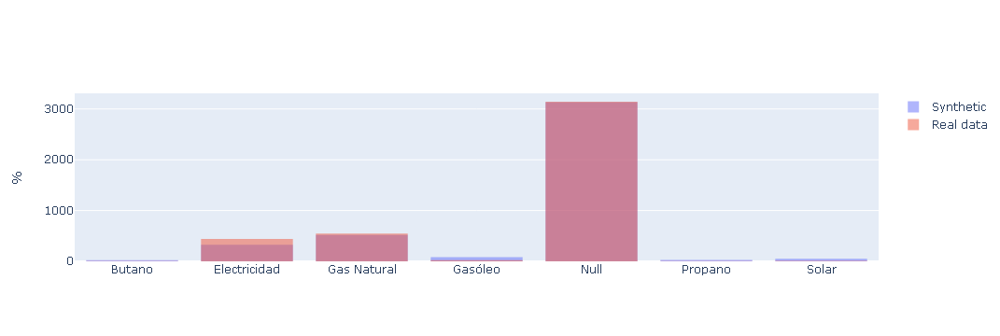

pets


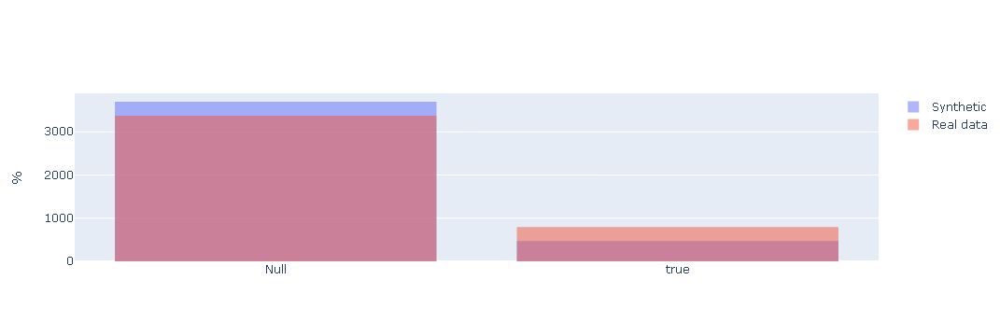

price


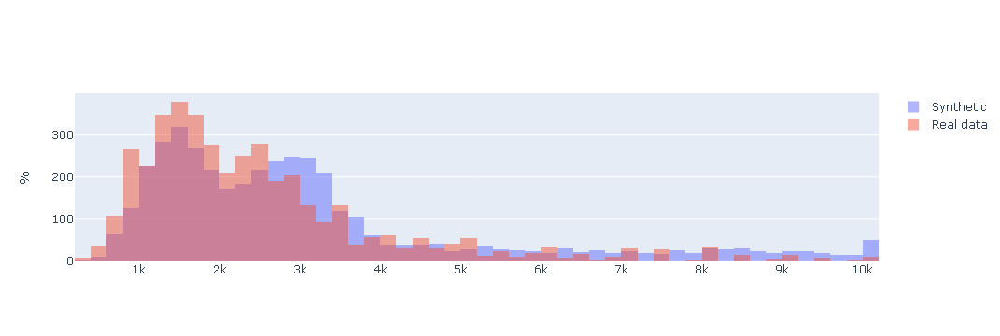

rooms


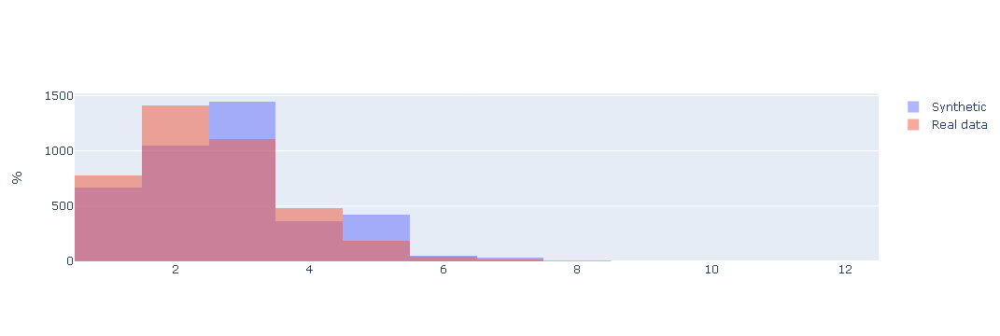

bathrooms


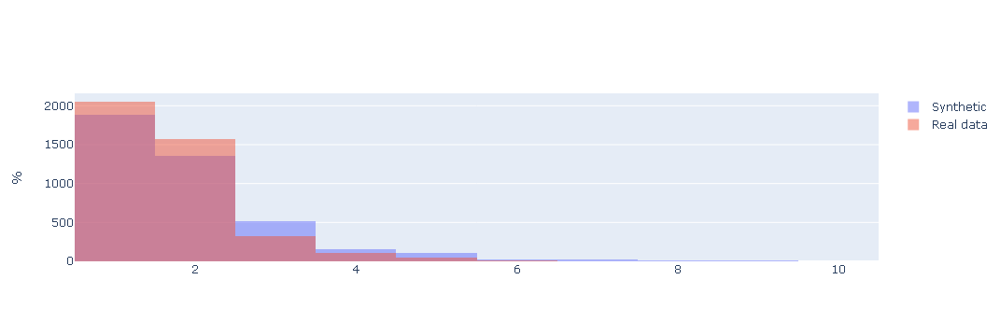

surface


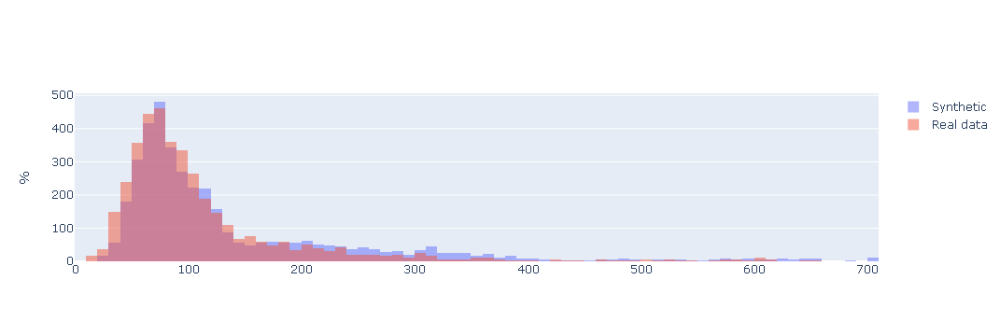

latitude


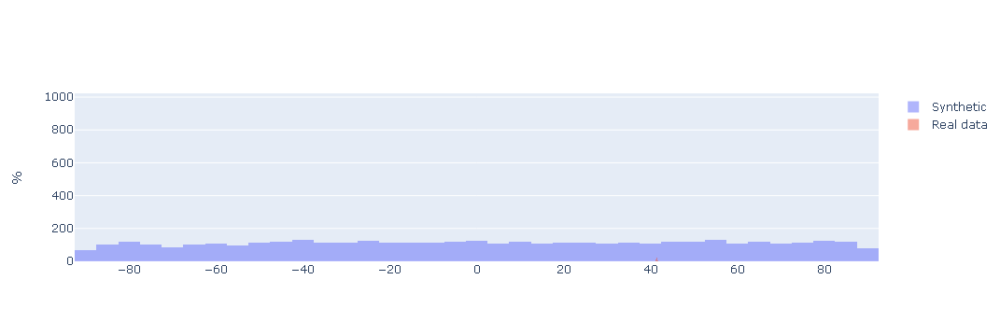

longitude


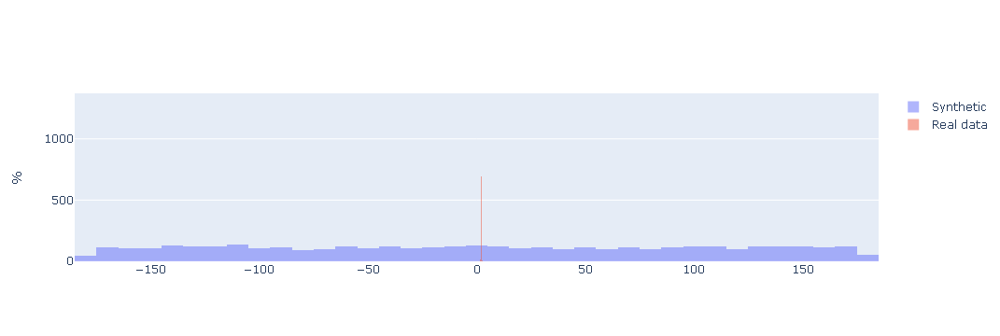

In [12]:
for c in group_cols+num_cols:    
    # if c not in ("formatted_address", "active"):
    #     if str(df[c].dtype) == "category":
    #         plot_type = "bar"
    #     else:
    #         plot_type = "displot"
    #     fig = get_column_plot(
    #         real_data=df[group_cols+num_cols],
    #         synthetic_data=synthetic_data,
    #         metadata=metadata,
    #         column_name=c,
    #         plot_type=plot_type
    #     ) 
    #     fig.show()
    if c not in ("formatted_address", "active", "city"):
        print(c)
        fig = go.Figure()
        fig.add_trace(go.Histogram(x=synthetic_data[c].sort_values(), name=f"Synthetic"))
        fig.add_trace(go.Histogram(x=df[c].sort_values(), name=f"Real data"))
        
        fig.update_layout(
            barmode="overlay",
            yaxis_title_text='%'
        )
        fig.update_traces(opacity=0.5)
        fig.show()

In [ ]:
# city, state, and latlon not well synthethized
# city, state from prob tables
# latlon from continous distribution (normal?)

In [13]:
probs = {}

for c in group_cols:    
    df_grouped = df.groupby(c).count().reset_index()[[c, "id"]]
    df_grouped[f"prob_{c}"] = 100 * df_grouped["id"] / df_grouped["id"].sum()
    df_grouped = df_grouped[[c, f"prob_{c}"]]
    probs[c] = df_grouped

probs

{'city':                      city  prob_city
 0                  Abrera   0.048008
 1              Aiguafreda   0.024004
 2                  Alella   0.216035
 3           Arenys de Mar   0.360058
 4          Arenys de Munt   0.072012
 ..                    ...        ...
 150   Vilanova del Vallès   0.096015
 151  Vilanova i la Geltrú   0.744119
 152       Vilassar de Mar   0.192031
 153                 Òdena   0.024004
 154                Òrrius   0.024004
 
 [155 rows x 2 columns],
 'type':             type  prob_type
 0    Apartamento  34.757561
 1   Casa adosada   2.112338
 2  Casa o chalet   7.753241
 3         Dúplex   1.752280
 4        Estudio   3.264522
 5  Finca rústica   0.384061
 6           Loft   0.624100
 7           Piso  44.071051
 8    Planta baja   0.888142
 9          Ático   4.392703,
 'orientation':   orientation  prob_orientation
 0        Null         66.370619
 1        Este          4.320691
 2     Noreste          3.336534
 3       Norte          2.904465
 

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
cauchy,14.695097,812.965945,825.608788,inf,0.114110,4.361579e-47
norminvgauss,15.671990,1250.089665,1275.375351,inf,0.085521,1.314506e-26
genhyperbolic,35.395255,1224.376731,1255.983839,inf,0.087781,5.192990e-28


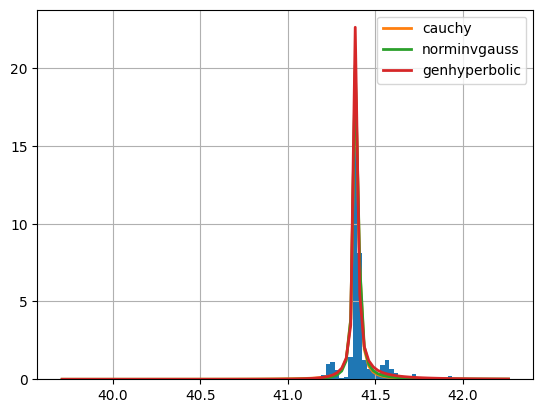

In [14]:
f = Fitter(df.latitude.dropna().values.tolist())
f.fit()
f.summary(Nbest=3)

In [15]:
lats = df.latitude.dropna().values

gennorm_dist = stats.fit(stats.gennorm, lats, {"beta": [0, 20], "scale": [-5, 20], "loc": [0, 100]})
norm_dist = stats.fit(stats.norm, lats, {"scale": [-5, 20], "loc": [0, 100]})
gennorm_data = [stats.gennorm.rvs(scale=gennorm_dist.params.scale, loc=gennorm_dist.params.loc,
                                  beta=gennorm_dist.params.beta) for i in range(0, len(lats))]
norm_data = [stats.norm.rvs(scale=norm_dist.params.scale, loc=norm_dist.params.loc) for i in range(0, len(lats))]

cauchy_data = [stats.cauchy.rvs(**f.get_best()["cauchy"]) for i in range(0, len(lats))]

hist_data = [gennorm_data, norm_data, cauchy_data, lats]
group_labels = ["Gennorm", "Normal", "Cauchy", "Real data"]

fig = ff.create_distplot(hist_data, group_labels, bin_size=.1) # , bin_size=.075s
fig.show()

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2357: RuntimeWarning:

overflow encountered in divide



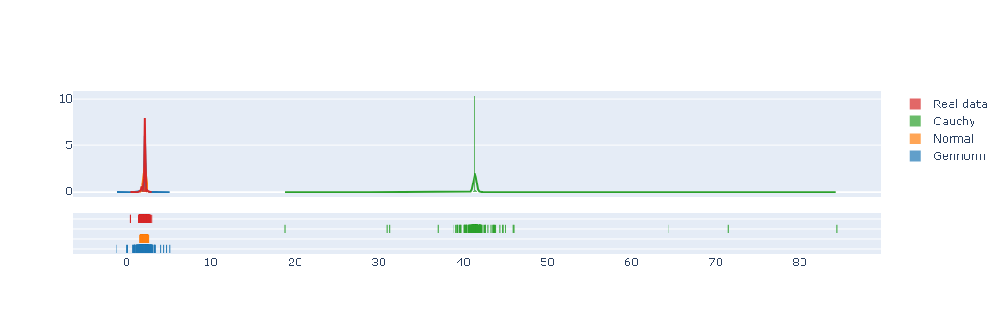

In [16]:
lons = df.longitude.dropna().values

gennorm_dist = stats.fit(stats.gennorm, lons, {"beta": [0, 20], "scale": [-5, 20], "loc": [0, 100]})
norm_dist = stats.fit(stats.norm, lons, {"scale": [-5, 20], "loc": [0, 100]})
gennorm_data = [stats.gennorm.rvs(scale=gennorm_dist.params.scale, loc=gennorm_dist.params.loc,
                                  beta=gennorm_dist.params.beta) for i in range(0, len(lons))]
norm_data = [stats.norm.rvs(scale=norm_dist.params.scale, loc=norm_dist.params.loc) for i in range(0, len(lons))]

# cauchy_data = [stats.cauchy.rvs(**f.get_best()["cauchy"]) for i in range(0, len(lons))]

hist_data = [gennorm_data, norm_data, cauchy_data, lons]
group_labels = ["Gennorm", "Normal", "Cauchy", "Real data"]

fig = ff.create_distplot(hist_data, group_labels, bin_size=.1) # , bin_size=.075s
fig.show()

In [ ]:
# from scipy.stats import poisson


# res = stats.fit(stats.poisson, df.rooms.dropna().values, {"mu": [0, 20], "scale": [-5, 5], "loc": [-10, 10]})

# print(res)

# test_data = [stats.poisson.rvs(mu=res.params.mu, loc=res.params.loc) for i in range(0, 4000)]

# fig = go.Figure()
        
# fig.add_trace(go.Histogram(x=test_data, histnorm="percent", name=f"Distribution"))
# fig.add_trace(go.Histogram(x=df.rooms.dropna().values, histnorm="percent", name=f"Real data"))

# fig.update_layout(
#     barmode="overlay",
#     yaxis_title_text='%'
# )
# fig.update_traces(opacity=0.5)
# fig.show()

In [ ]:
# res = stats.fit(stats.poisson, df.bathrooms.dropna().values, {"mu": [0, 20], "scale": [-5, 5], "loc": [-10, 10]})

# print(res)

# test_data = [stats.poisson.rvs(mu=res.params.mu, loc=res.params.loc) for i in range(0, 4000)]

# fig = go.Figure()
        
# fig.add_trace(go.Histogram(x=test_data, histnorm="percent", name=f"Distribution"))
# fig.add_trace(go.Histogram(x=df.bathrooms.dropna().values, histnorm="percent", name=f"Real data"))

# fig.update_layout(
#     barmode="overlay",
#     yaxis_title_text='%'
# )
# fig.update_traces(opacity=0.5)
# fig.show()


In [ ]:
# poisson_dist = poisson(mu=2.546734972962387)
# poisson_dist


In [ ]:
# for discrete

# from distfit import distfit

# dfit = distfit(method="discrete")

# dfit.fit_transform(df.rooms.dropna().values)
# dfit.model

In [ ]:
# dfit.plot()

In [ ]:
# dfit.model["params"]

In [ ]:
# from scipy.stats import binom

# test_data = [binom.rvs(*dfit.model["params"], loc=-1) for i in range(0, 4000)]

# fig = go.Figure()
# fig.add_trace(go.Histogram(x=test_data, histnorm="percent", name=f"Distribution"))
# fig.add_trace(go.Histogram(x=df.rooms.dropna().values, histnorm="percent", name=f"Real data"))

# fig.update_layout(
#     barmode="overlay",
#     yaxis_title_text='%'
# )
# fig.update_traces(opacity=0.5)
# fig.show()

In [ ]:
# dfit.distributions



In [ ]:
# f = Fitter(df.surface.dropna().values.tolist())
# f.fit()
# f.summary(Nbest=3)

In [ ]:
# df.surface.dropna()

In [ ]:
# test_data = [stats.burr12.rvs(**f.get_best()["burr12"]) for i in range(0, 3700)]

# fig = go.Figure()
# fig.add_trace(go.Histogram(x=test_data, name=f"Distribution"))
# fig.add_trace(go.Histogram(x=df.surface.dropna().values, name=f"Real data"))

# fig.update_layout(
#     barmode="overlay",
#     yaxis_title_text='%'
# )
# fig.update_traces(opacity=0.5)
# fig.show()

In [ ]:
# f = Fitter(df.price.dropna().values.tolist())
# f.fit()
# f.summary()

In [ ]:
# df[group_cols].dtypes

In [ ]:
# from ctgan import CTGAN

# # Initialize and train the CTGAN model
# ctgan = CTGAN()
# ctgan.fit(original_data, group_cols, epochs=100)

# # Generate synthetic data
# synthetic_data_ctgan = ctgan.sample(len(original_data))

# # The result is a pandas DataFrame of synthetic data
# print(synthetic_data_ctgan.head())

In [ ]:
# ctgan.sample(num_rows=5)

In [ ]:
# df_geo = pd.DataFrame({"lat": [geocode_result[0]["geometry"]["location"]["lat"]],
#                       "lng": geocode_result[0]["geometry"]["location"]["lng"]})

# geometry = gpd.points_from_xy(df_geo.lng, df_geo.lat)
# df_geo = gpd.GeoDataFrame(
#     df_geo[["lat", "lng"]], geometry=geometry
# )

# df_geo

In [ ]:
# map_city = folium.Map(location=[df_geo["lat"], df_geo["lng"]], tiles="OpenStreetMap", zoom_start=12)
# map_city.add_child(
#         folium.Marker(
#             location=[df_geo["lat"], df_geo["lng"]]))
# map_city